In [1]:
!nvidia-smi

Tue Sep 26 23:33:31 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.125.06   Driver Version: 525.125.06   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            On   | 00000000:00:1E.0 Off |                    0 |
| N/A   40C    P8    10W /  70W |      2MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

### Librerias

In [2]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

import torch
from datasets import Dataset
from transformers import pipeline
from transformers.pipelines.pt_utils import KeyDataset


from tqdm import tqdm

from utils import (
    reducir_dimensiones,
    generar_clusters,
    palabras_importantes_por_cluster,
    palabras_importantes_general
)

In [3]:
pd.set_option("display.max_colwidth", None)

### Variables

In [4]:
SEED = 1399

### Conjunto de Datos

#### Cargar datos

In [5]:
# Se cargan los datos
data = pd.read_parquet("data.parquet")
print(f"Filas: {data.shape[0]:,}")
print(f"Columnas: {data.shape[1]}")
data.head(2)

Filas: 85,823
Columnas: 1029


,review,brand,first_category_item,longitud_rev,sentimiento,0,1,2,3,4,...,1014,1015,1016,1017,1018,1019,1020,1021,1022,1023
0,"i cannot describe the exciment of this game. i'm sick and tired of playing ""good guys"" games.",Sony,Video Games,93,NEG,0.027637,-0.001091,-0.010039,0.049361,-0.014932,...,0.026781,-0.034396,-0.010686,-0.004930,0.053155,0.045730,0.007860,-0.035969,-0.009982,-0.018014
1,no clue how to contact the manufacturer - but i received this a couple days ago and it does not work. didn't come with a cable and my current one will not work with it. so either i got a defective one or something.,Sony,Video Games,216,NEG,-0.024440,0.013258,-0.029556,0.009211,-0.015974,...,0.013587,-0.033724,-0.043575,-0.064859,0.026906,0.042064,0.039257,-0.031726,0.006738,-0.012857


#### Preparar datos

In [6]:
# Separamos en variables y embeddings
variables_df = data.loc[:, ["review", "brand", "first_category_item", "longitud_rev", "sentimiento"]]
embeddings = data.loc[:, [str(dim) for dim in range(1024)]].to_numpy()

## Nintendo

In [7]:
# Se guardan los indices de las reviews de Nintendo
idx_nintendo = variables_df[variables_df["brand"] == "Nintendo"].index.to_list()
variables_df_nintendo = variables_df.copy()[variables_df["brand"] == "Nintendo"].reset_index(drop=True)
print(variables_df_nintendo.shape[0])

15871


#### Reduccion de dimensionalidad

In [8]:
# Se definen los parametros modelo a utilizar [UMAP]
umap_kwargs = {
    "n_neighbors": 15,
    "min_dist": 0.1,
    "n_components": 2,
    "metric": "cosine",
    "output_type": "pandas",
    "random_state": SEED
}

In [9]:
# Se reduce la dimensionalidad
embeddings_nintendo = reducir_dimensiones(
    embeddings=embeddings[idx_nintendo],
    umap_kwargs=umap_kwargs
)

# Imprimimos la nueva dimensionalidad
print(f"Nueva dimensionalidad: {embeddings_nintendo.shape}")

Reduciendo la dimension de los embeddings...
Dimension de embeddings reducida!
Nueva dimensionalidad: (15871, 2)


Text(0.5, 0, 'dim1')

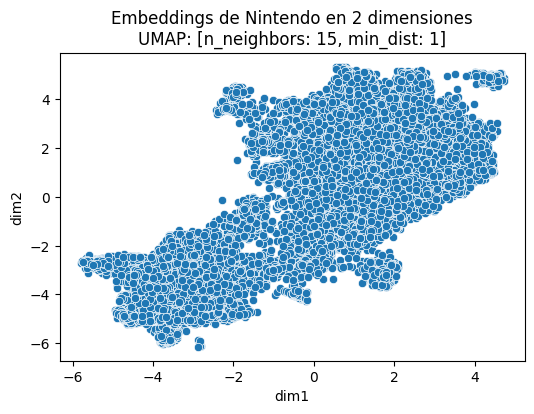

In [10]:
# Se visualizan los embeddings en 2 dimensiones
plt.figure(figsize=(6, 4))
sns.scatterplot(
    x=embeddings_nintendo[0],
    y=embeddings_nintendo[1],
)
plt.title("Embeddings de Nintendo en 2 dimensiones\nUMAP: [n_neighbors: 15, min_dist: 1]")
plt.ylabel("dim2")
plt.xlabel("dim1")

#### Clusters

In [11]:
# Se definen los parametros modelo a utilizar [HDBSCAN]
hdbscan_kwargs = {
    "min_cluster_size": 15
}

In [12]:
# Se obtienen los clusters
clusters = generar_clusters(
    embeddings=embeddings_nintendo,
    hdbscan_kwargs=hdbscan_kwargs
)

# Imprimimos el numero de clusters generado
print(f"Numero de clusters: {clusters.nunique()}")

Generando clusters...
Clusters generados!
Numero de clusters: 74


In [13]:
# Guardamos los datos en el dataframe de Nintendo
variables_df_nintendo["dim1"] = embeddings_nintendo[0]
variables_df_nintendo["dim2"] = embeddings_nintendo[1]
variables_df_nintendo["cluster"] = clusters

In [14]:
# Se visualizan los clusters
fig = px.scatter(
    data_frame=variables_df_nintendo,
    x="dim1",
    y="dim2",
    hover_data="review",
    color="cluster",

)
fig.update_layout(width=600, height=400)

#### Keywords por cluster

In [15]:
# Se definen los parametros modelo a utilizar [TFIDF]
tfidf_kwargs = {
    "lowercase": False,
    "stop_words": "english",
    "min_df": 5
}

In [16]:
# Se obtienen los keywords
keywords_nintendo_df = palabras_importantes_general(
    data=variables_df_nintendo,
    unique_clusters=variables_df_nintendo["cluster"].unique(),
    n_words=10,
    tfidf_kwargs=tfidf_kwargs
)

Obteniendo el top 10 de palabras...


100%|██████████| 74/74 [00:32<00:00,  2.29it/s]

Top 10 de palabras obtenido...


In [17]:
# Se visualizan los clusters
keywords_nintendo_df

,cluster,keywords
0,-1,"[game, work, wii, did, didn, games, play, just, product, like]"
1,13,"[wii, games, nintendo, game, console, just, like, xbox, good, play]"
2,21,"[game, mario, like, games, play, just, fun, don, really, boring]"
3,59,"[used, came, new, dirty, scratches, charger, battery, product, condition, cover]"
4,14,"[game, mana, emblem, just, characters, games, series, time, like, story]"
...,...,...
69,20,"[disc, game, work, read, disappointed, console, return, fine, new]"
70,63,"[wii, original, remote, controller, work, fit, plus]"
71,46,"[ds, browser, slow, support, web, load, really, use, page, speed]"
72,6,"[game, wrestling, just, bad, games, good, like, smackdown, wrestlemania, really]"


#### Topicos

In [18]:
# Se carga el modelo de generacion de texto
generator = pipeline(
    task="text2text-generation",
    model="google/flan-t5-base",
    device="cuda",
    torch_dtype=torch.bfloat16
)

In [19]:
# Se crea un dataset para hacer inferencia de forma eficiente
kw_df = Dataset.from_pandas(keywords_nintendo_df)

# Se crea una funcion para crear los prompts
def create_prompts(examples):
    prompt = "I have a topic described by the following keywords: {kw}. Based on the previous keywords, what is this topic about?"
    examples["prompt"] = [prompt.format(kw=kw) for kw in examples["keywords"]]
    return examples

# Se crean los prompts
kw_df = kw_df.map(create_prompts, batched=True)

# Se inspeccionan los primeros prompts
kw_df["prompt"][:5]

Map:   0%|          | 0/74 [00:00<?, ? examples/s]

["I have a topic described by the following keywords: ['game', 'work', 'wii', 'did', 'didn', 'games', 'play', 'just', 'product', 'like']. Based on the previous keywords, what is this topic about?",
 "I have a topic described by the following keywords: ['wii', 'games', 'nintendo', 'game', 'console', 'just', 'like', 'xbox', 'good', 'play']. Based on the previous keywords, what is this topic about?",
 "I have a topic described by the following keywords: ['game', 'mario', 'like', 'games', 'play', 'just', 'fun', 'don', 'really', 'boring']. Based on the previous keywords, what is this topic about?",
 "I have a topic described by the following keywords: ['used', 'came', 'new', 'dirty', 'scratches', 'charger', 'battery', 'product', 'condition', 'cover']. Based on the previous keywords, what is this topic about?",
 "I have a topic described by the following keywords: ['game', 'mana', 'emblem', 'just', 'characters', 'games', 'series', 'time', 'like', 'story']. Based on the previous keywords, wha

In [20]:
# Se generan los topicos
topicos = generator(kw_df["prompt"])

In [22]:
# Se añaden al dataframe
keywords_nintendo_df["topicos"] = [topico["generated_text"] for topico in topicos]
keywords_nintendo_df

,cluster,keywords,topicos
0,-1,"[game, work, wii, did, didn, games, play, just, product, like]",Game
1,13,"[wii, games, nintendo, game, console, just, like, xbox, good, play]",Nintendo Wii
2,21,"[game, mario, like, games, play, just, fun, don, really, boring]",Mario
3,59,"[used, came, new, dirty, scratches, charger, battery, product, condition, cover]",Science/Tech
4,14,"[game, mana, emblem, just, characters, games, series, time, like, story]",Game
...,...,...,...
69,20,"[disc, game, work, read, disappointed, console, return, fine, new]",game
70,63,"[wii, original, remote, controller, work, fit, plus]",Wii
71,46,"[ds, browser, slow, support, web, load, really, use, page, speed]",Science/Tech
72,6,"[game, wrestling, just, bad, games, good, like, smackdown, wrestlemania, really]",wrestling
